In [1]:
import numpy as np
import pandas as pd #To read the dataset
import matplotlib.pyplot as plt #Plotting
import time
from IPython import display
%matplotlib inline
from matplotlib import animation

In [2]:
dataset = pd.read_csv('gd-data.csv')



data = dataset.values

numInstances = data.shape[0]

dataset.shape

(99, 2)

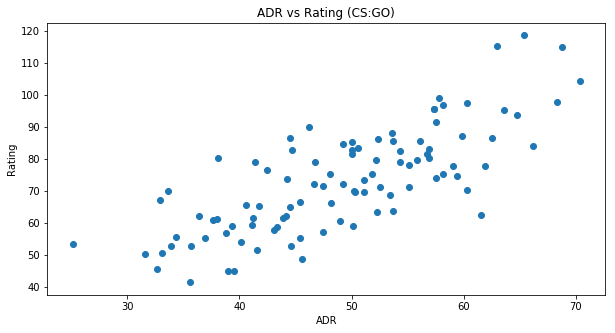

In [3]:
plt.figure(figsize=(10,5))
plt.title('ADR vs Rating (CS:GO)')
plt.scatter(x=data[:,0],y=data[:,1])
plt.xlabel('ADR')
plt.ylabel('Rating')
plt.show()

In [4]:
def SSE(m,b,data):
    
    totalError = 0.0
    
    for i in range(numInstances):
        
        adr = data[i,0] #Row 'i' column 'ADR'
        rating = data[i,1] #Row 'i' column 'Rating'
        
        #The real rating
        currentTarget = rating
        
        #Predicted rating with our current fitting line
        #y = mx + b
        currentOutput = m*adr + b
        
        #Compute squared error
        currentSquaredError = (currentTarget - currentOutput)**2

        
        #Add it to the total error
        totalError += currentSquaredError

    sse = totalError/numInstances
    
    return totalError

In [5]:
m = 2
b = 3

sse = SSE(m,b,data)

print('For the fitting line: y = %sx + %s\nSSE: %.2f' %(m,b,sse))

For the fitting line: y = 2x + 3
SSE: 93446.12


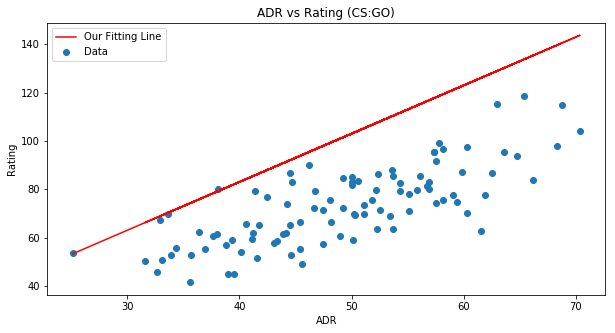

In [6]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
ax.set_title('ADR vs Rating (CS:GO)')
ax.scatter(x=data[:,0],y=data[:,1],label='Data')
plt.plot(data[:,0], m*data[:,0] + b,color='red',label='Our Fitting Line')
ax.set_xlabel('ADR')
ax.set_ylabel('Rating')
ax.legend(loc='best')

plt.show()

In [44]:
def gradient_descent_step(m,b,data):
    
    N = numInstances
    m_grad = 0
    b_grad = 0
    
    for i in range(N):

        #Get current pair (x,y)
        x = data[i,0]
        y = data[i,1]

        #Partial derivative respect 'm'
        dm = -((2/N) * x * (y - (m*x + b)))
        
        #Partial derivative respect 'b'
        db = - ((2/N) * (y - (m*x + b)))
    
        #Update gradient
        m_grad = m_grad + dm
        b_grad = b_grad + db
    
    #Set the new 'better' updated 'm' and 'b'
    m_updated = m - 0.0001*m_grad
    b_updated = b - 0.0001*b_grad

    '''
    Important note: The value '0.0001' that multiplies the 'm_grad' and 'b_grad' is the 'learning rate', but it's a concept
    out of the scope of this challenge. For now, just leave that there and think about it like a 'smoother' of the learn, 
    to prevent overshooting, that is, an extremly fast and uncontrolled learning.
    '''
    
    return m_updated,b_updated

In [45]:

m = 2
b = 3

sse = SSE(m,b,data)

print('Starting line: y = %.2fx + %.2f - Error: %.2f' %(m,b,sse))

for i in range(2):
    m,b = gradient_descent_step(m,b,data)
    sse = SSE(m,b,data)
    print('At step %d - Line: y = %.2fx + %.2f - Error: %.2f' %(i+1,m,b,sse))

print('\nBest  line: y = %.2fx + %.2f - Error: %.2f' %(m,b,sse))

Starting line: y = 2.00x + 3.00 - Error: 93446.12
At step 1 - Line: y = 1.71x + 2.99 - Error: 31366.21
At step 2 - Line: y = 1.57x + 2.99 - Error: 15925.78

Best  line: y = 1.57x + 2.99 - Error: 15925.78


In [46]:

def gradient_descent_n_steps(m_starting,b_starting,data,steps): #For doing it many times in an easy way ;)
    print('Starting line: y = %.6fx + %.6f - Error: %.6f\n' %(m_starting,b_starting,SSE(m_starting,b_starting,data)))
    m = m_starting
    b = b_starting
    display_freq = steps//10
    for i in range(steps):
        m,b = gradient_descent_step(m,b,data)
        if(i % display_freq == 0):
            sse = SSE(m,b,data)
            error_list.append(sse)
            print('At step %d - Line: y = %.6fx + %.6f - Error: %.6f' %(i+1,m,b,sse))
    
    
    print('\nBest  line: y = %.6fx + %.6f - Error: %.6f' %(m,b,sse))
    return m,b

In [92]:
M_STARTING = 0
B_STARTING = 0
NUM_STEPS = 1200

In [117]:
error_list = list()
sse_list = list()
error = []    
def error_plot(fig,ax,error_list,error,data,step):
    #PLOT2

    ax.cla()
    
    ax.set_title('Error (step %d)' % step)
    ax.set_xlabel('Iteration number')
    ax.set_ylabel('Error')
    
    ax.plot(np.arange(0,len(error_list)),error_list)    
    fig.canvas.draw()
    
def gradient_descent_n_steps_with_error_plot(m_starting,b_starting,data,steps): #For doing it many times in an easy way ;)
  
    m = m_starting
    b = b_starting

    error_list.clear()
    error = SSE(m,b,data)
    display_freq = steps//10
    sse_list.append(data[:,0]*m+b)
    for i in range(steps):
      
        m,b = gradient_descent_step(m,b,data)
        sse = SSE(m,b,data)
        error_list.append(sse)
        #time.sleep(10/steps)
        #############
        if(i % display_freq == 0):
            print('At step %d - Line: y = %.6fx + %.6f - Error: %.6f' %(i+1,m,b,sse))
            sse_list.append(data[:,0]*m+b)
    
            
#end def

#RUN IT!




In [118]:
m_best,b_best = gradient_descent_n_steps(M_STARTING,B_STARTING,data,NUM_STEPS)

Starting line: y = 0.000000x + 0.000000 - Error: 555505.449229

At step 1 - Line: y = 0.742434x + 0.014630 - Error: 146425.119408
At step 121 - Line: y = 1.480897x + 0.037834 - Error: 10994.647054
At step 241 - Line: y = 1.480726x + 0.046547 - Error: 10994.020451
At step 361 - Line: y = 1.480556x + 0.055253 - Error: 10993.394955
At step 481 - Line: y = 1.480385x + 0.063951 - Error: 10992.770562
At step 601 - Line: y = 1.480215x + 0.072641 - Error: 10992.147271
At step 721 - Line: y = 1.480044x + 0.081324 - Error: 10991.525079
At step 841 - Line: y = 1.479874x + 0.089999 - Error: 10990.903986
At step 961 - Line: y = 1.479704x + 0.098666 - Error: 10990.283989
At step 1081 - Line: y = 1.479535x + 0.107326 - Error: 10989.665086

Best  line: y = 1.479366x + 0.115906 - Error: 10989.665086


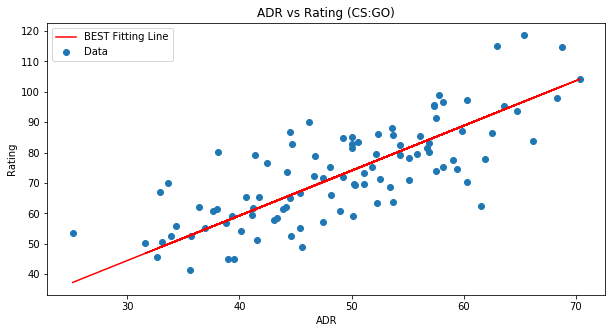

In [120]:
m=m_best
b=b_best
x = data[:,0]

fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
ax.set_title('ADR vs Rating (CS:GO)')
ax.scatter(x=x,y=data[:,1],label='Data')
plt.plot(x, m*x + b,color='red',label='BEST Fitting Line')
ax.set_xlabel('ADR')
ax.set_ylabel('Rating')
ax.legend(loc='best')

plt.show()

In [119]:
gradient_descent_n_steps_with_error_plot(M_STARTING,B_STARTING,data,NUM_STEPS)

At step 1 - Line: y = 0.742434x + 0.014630 - Error: 146425.119408
At step 121 - Line: y = 1.480897x + 0.037834 - Error: 10994.647054
At step 241 - Line: y = 1.480726x + 0.046547 - Error: 10994.020451
At step 361 - Line: y = 1.480556x + 0.055253 - Error: 10993.394955
At step 481 - Line: y = 1.480385x + 0.063951 - Error: 10992.770562
At step 601 - Line: y = 1.480215x + 0.072641 - Error: 10992.147271
At step 721 - Line: y = 1.480044x + 0.081324 - Error: 10991.525079
At step 841 - Line: y = 1.479874x + 0.089999 - Error: 10990.903986
At step 961 - Line: y = 1.479704x + 0.098666 - Error: 10990.283989
At step 1081 - Line: y = 1.479535x + 0.107326 - Error: 10989.665086


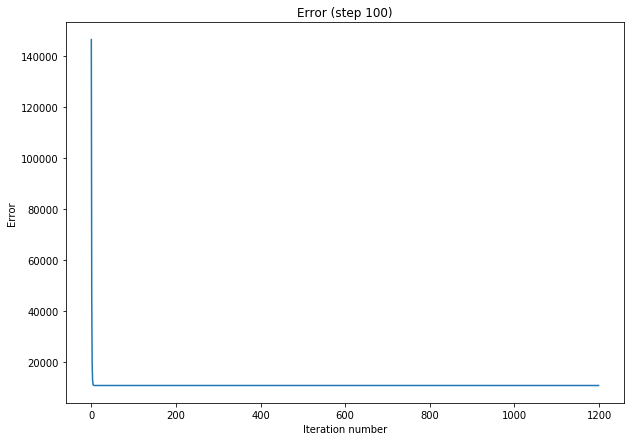

In [116]:
fig,ax = plt.subplots(1,1,figsize=(10,7))
error_plot(fig,ax,error_list,error,data,steps)

In [113]:
%%capture
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
%matplotlib inline

x = np.arange(0,len(error_list))
y = error_list
fig = plt.figure(figsize=(10,5)) 
sub = fig.add_subplot(111, xlim=(0, len(x)),ylim=(8000, 26410))

PLOT, = sub.plot([],[])

def animate(i):
    PLOT.set_data(x[:i],y[:i])
    return PLOT,

ani = animation.FuncAnimation(fig, animate, frames=len(x), interval=1, blit=True)

In [114]:
from IPython.display import HTML
HTML(ani.to_jshtml())

In [121]:
%%capture
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

x = data[:,0]
y = sse_list
fig = plt.figure(figsize=(10,5))
sub = fig.add_subplot(111)#, xlim=(0, 3),ylim=(0, 3))
sub.scatter(x=data[:,0],y=data[:,1],label='Data')
PLOT, = sub.plot([],[],color='red',label='BEST Fitting Line')

def animate(i):
    PLOT.set_data(x,y[i])
    return PLOT,

ani = animation.FuncAnimation(fig, animate, frames=len(y), interval=10, blit=True)


In [122]:
from IPython.display import HTML
HTML(ani.to_jshtml())